In [1]:
!pip install hickle

You are using pip version 10.0.1, however version 19.3.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [13]:
import matplotlib.pyplot as plt
import cPickle as pickle
import tensorflow as tf
from core.solver import CaptioningSolver
from core.model import CaptionGenerator
from core.utils import load_coco_data
from core.bleu import evaluate

%matplotlib inline
plt.rcParams['figure.figsize'] = (20, 15)  # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
data = load_coco_data(data_path='./data', split='val')
with open('./data/train/word_to_idx.pkl', 'rb') as f:
    word_to_idx = pickle.load(f)

image_idxs <type 'numpy.ndarray'> (19589,) int32
file_names <type 'numpy.ndarray'> (4052,) <U51
features <type 'numpy.ndarray'> (4052, 196, 512) float32
captions <type 'numpy.ndarray'> (19589, 17) int32
Elapse time: 0.87


In [4]:
model = CaptionGenerator(word_to_idx, dim_feature=[196, 512], dim_embed=512,
                                   dim_hidden=1024, n_time_step=16, prev2out=True, 
                                             ctx2out=True, alpha_c=1.0, selector=True, dropout=True)

W1107 10:20:23.246757 140471284201280 lazy_loader.py:50] 
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

W1107 10:20:23.249252 140471284201280 deprecation_wrapper.py:119] From core/model.py:56: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.



In [5]:
solver = CaptioningSolver(model, data, data, n_epochs=15, batch_size=128, update_rule='adam',
                                      learning_rate=0.0025, print_every=2000, save_every=1, image_path='./image/val2014_resized',
                                pretrained_model=None, model_path='./model/lstm', test_model='./model/lstm/model-20',
                                 print_bleu=False, log_path='./log/')

W1107 10:20:23.315290 140471284201280 deprecation_wrapper.py:119] From core/solver.py:54: The name tf.train.AdamOptimizer is deprecated. Please use tf.compat.v1.train.AdamOptimizer instead.



Sampled Caption: a man riding a wave on top of a surfboard .


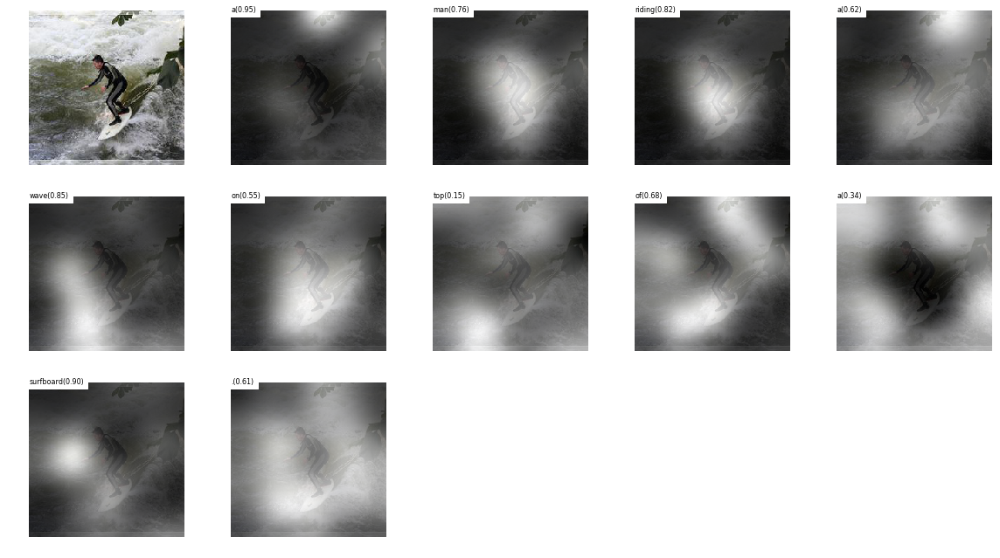

Sampled Caption: a person holding a snowboard on top of a mountain .


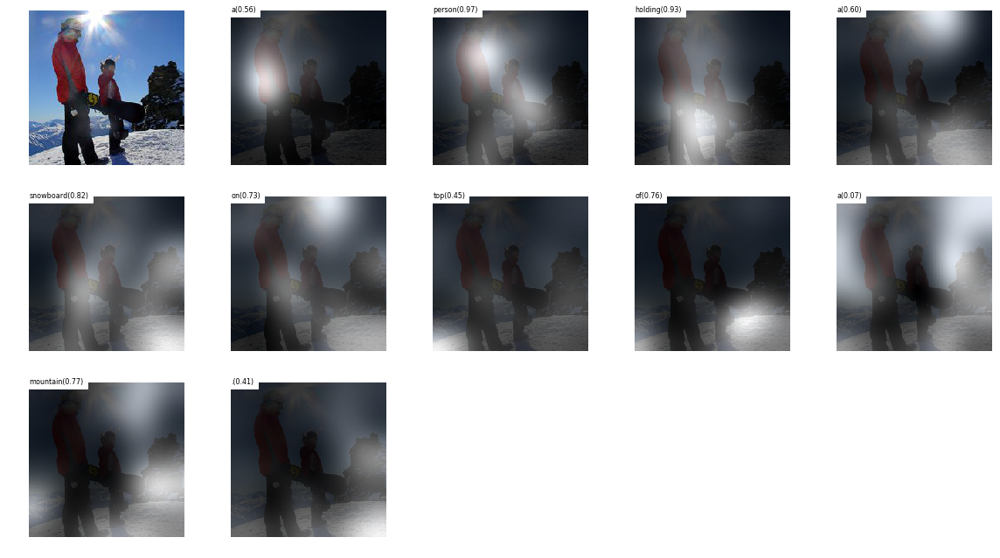

Sampled Caption: a group of people standing on a beach .


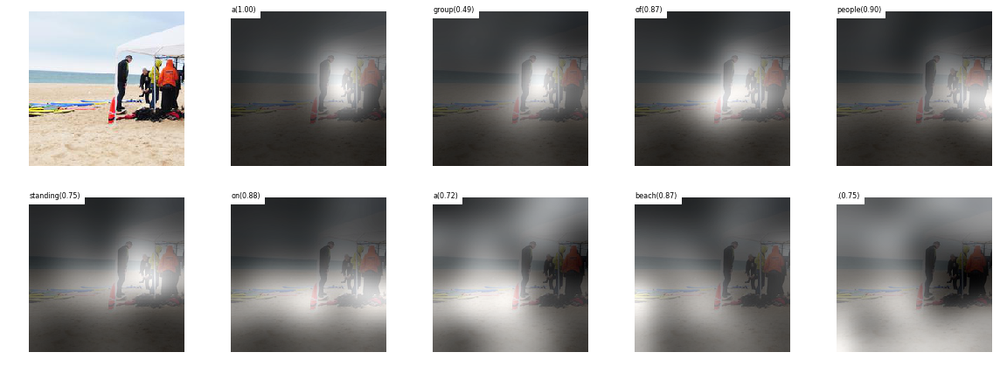

Sampled Caption: a man in a suit standing in front of a doorway .


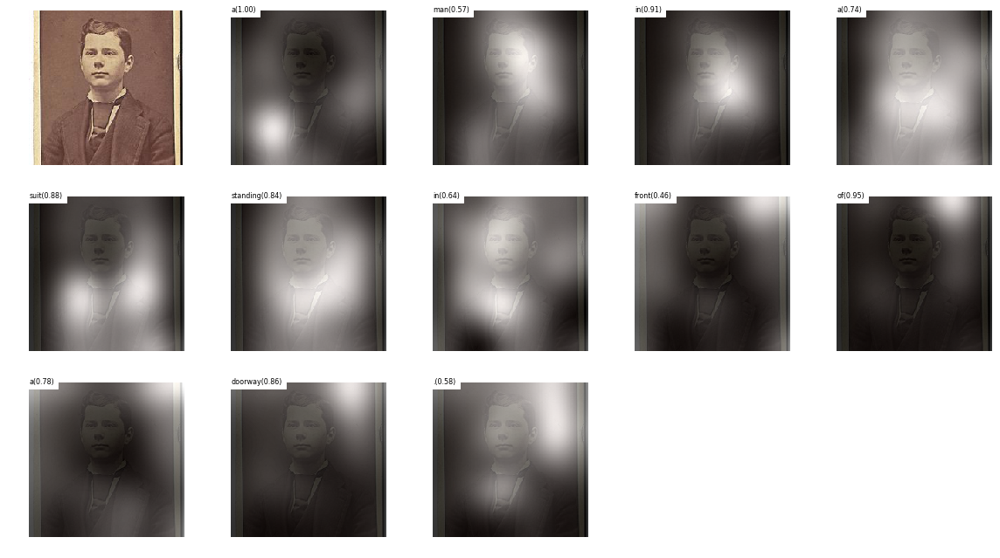

Sampled Caption: a girl in a pink shirt sitting on a pole with her pink flowers .


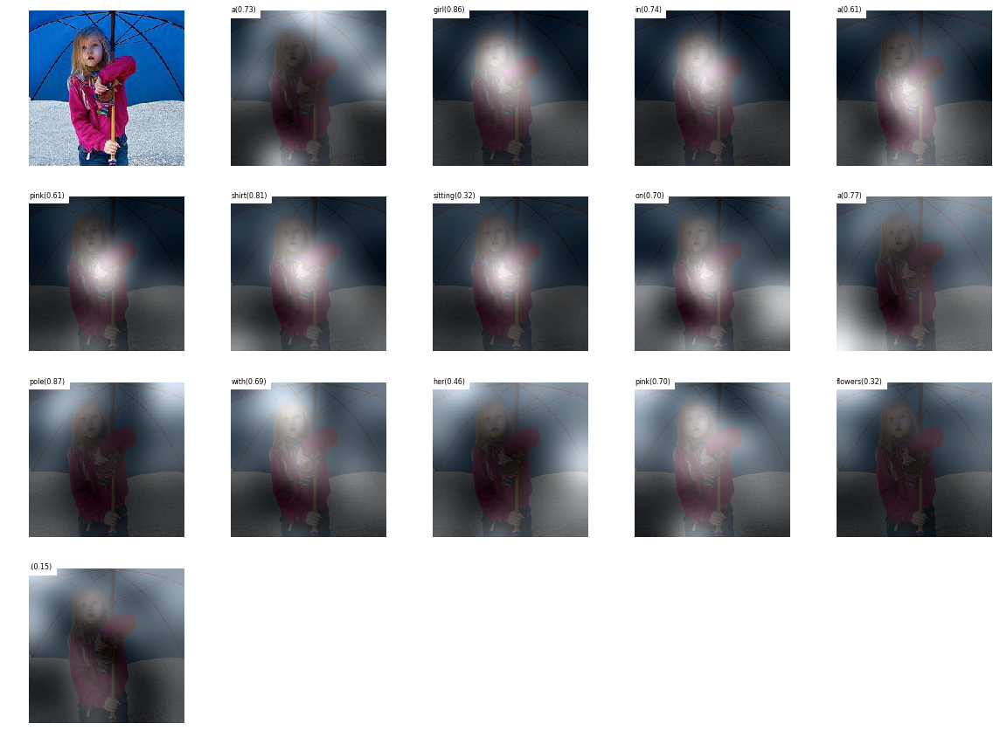

Sampled Caption: a man with a hat and glasses on a motorcycle .


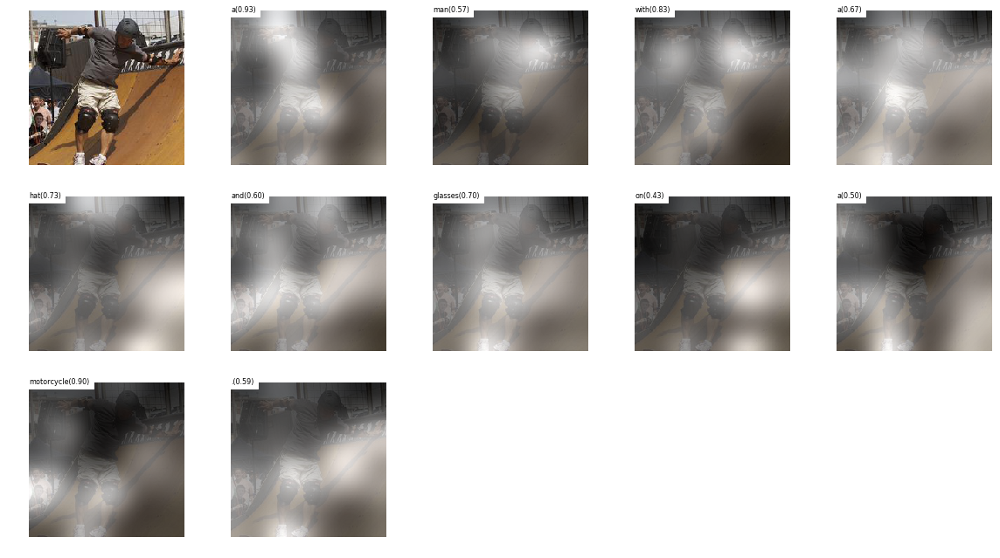

Sampled Caption: a person on a snowboard is going down a snowy hill .


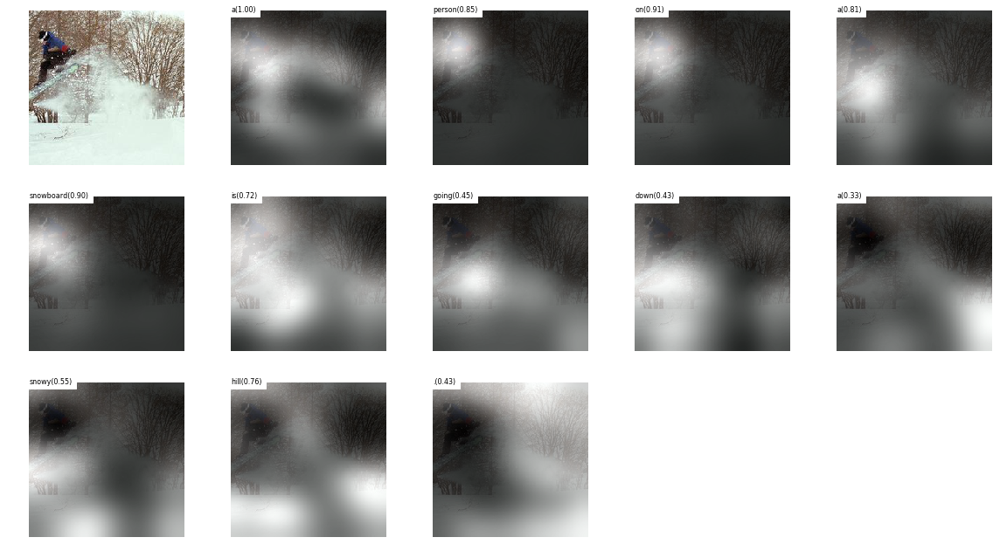

Sampled Caption: a large clock tower is shown on the side of a building .


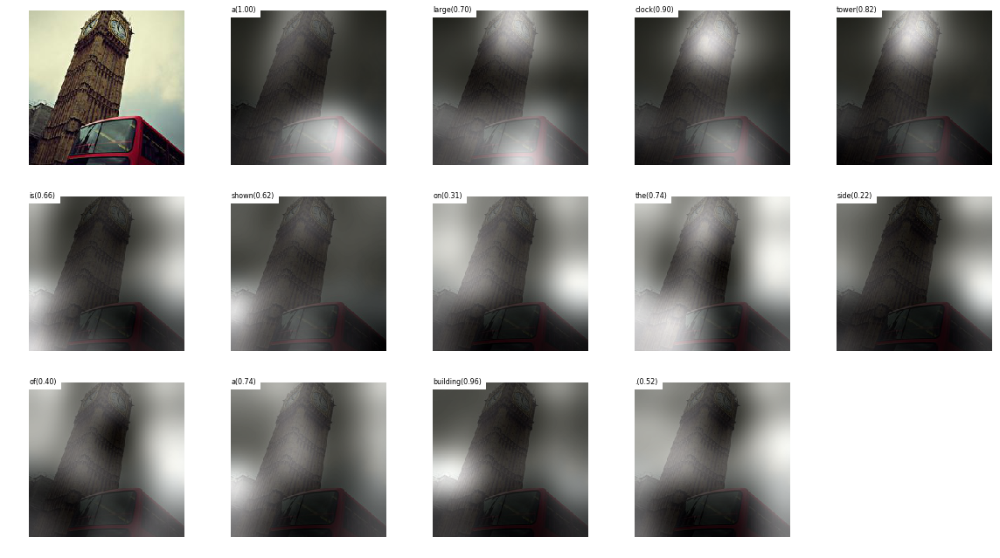

Sampled Caption: a small dog on a green field with a dog .


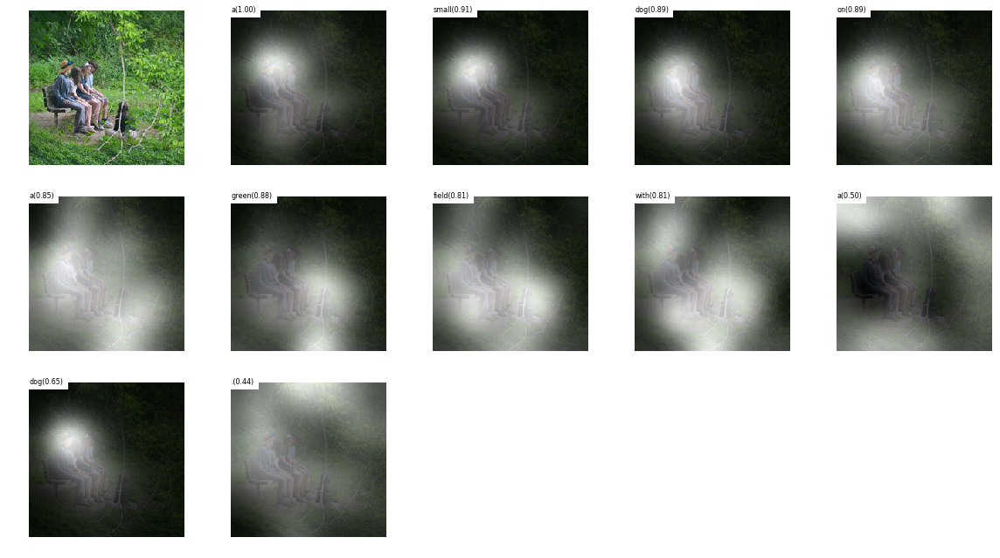

Sampled Caption: a large city bus parked next to a neighborhood .


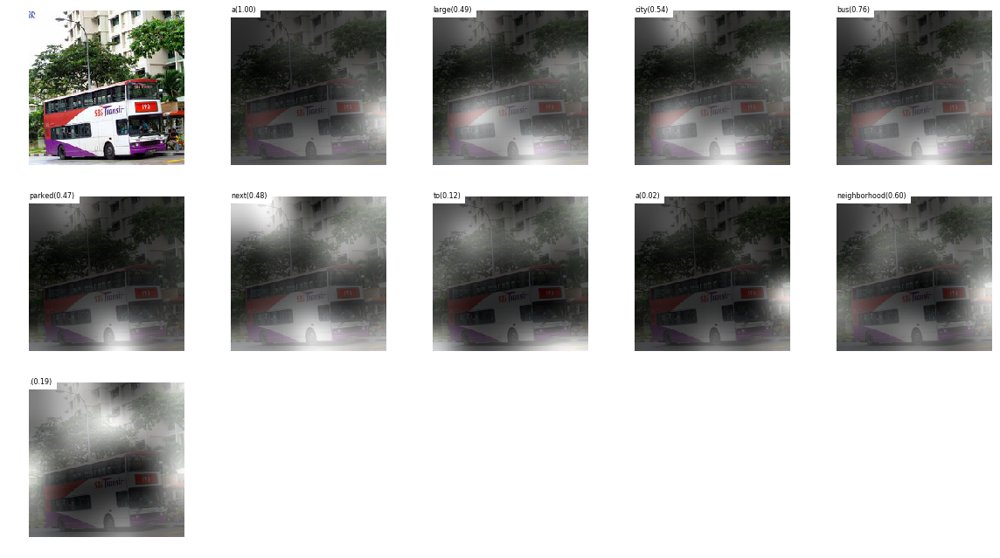

Saved ./data/val/val.candidate.captions.pkl..


In [14]:
solver.test(data, split='val')

In [15]:
test = load_coco_data(data_path='./data', split='test')

image_idxs <type 'numpy.ndarray'> (19589,) int32
file_names <type 'numpy.ndarray'> (4048,) <U51
features <type 'numpy.ndarray'> (4048, 196, 512) float32
captions <type 'numpy.ndarray'> (19589, 17) int32
Elapse time: 0.86


Sampled Caption: a group of people standing around a table with a glass of wine .


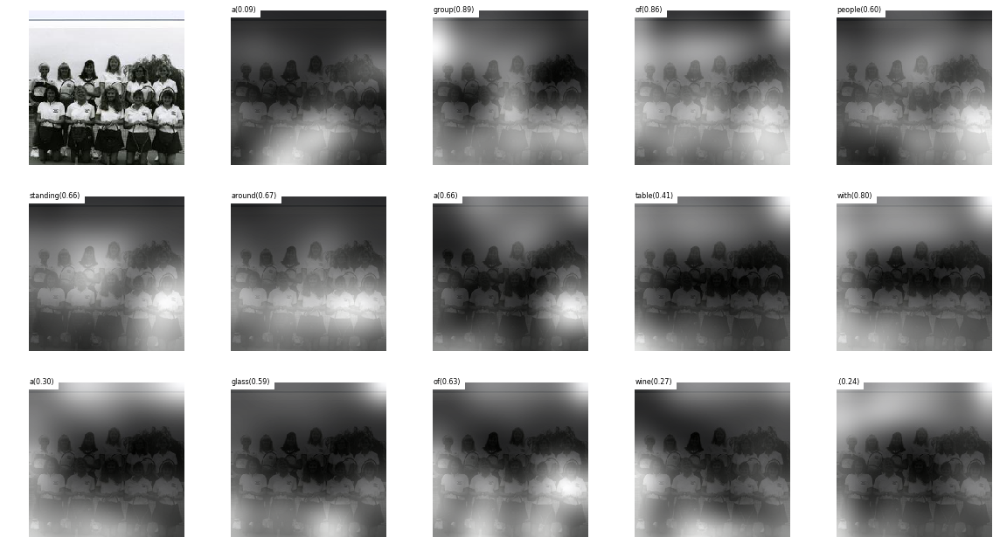

Sampled Caption: a woman standing in a snow covered field with a red frisbee .


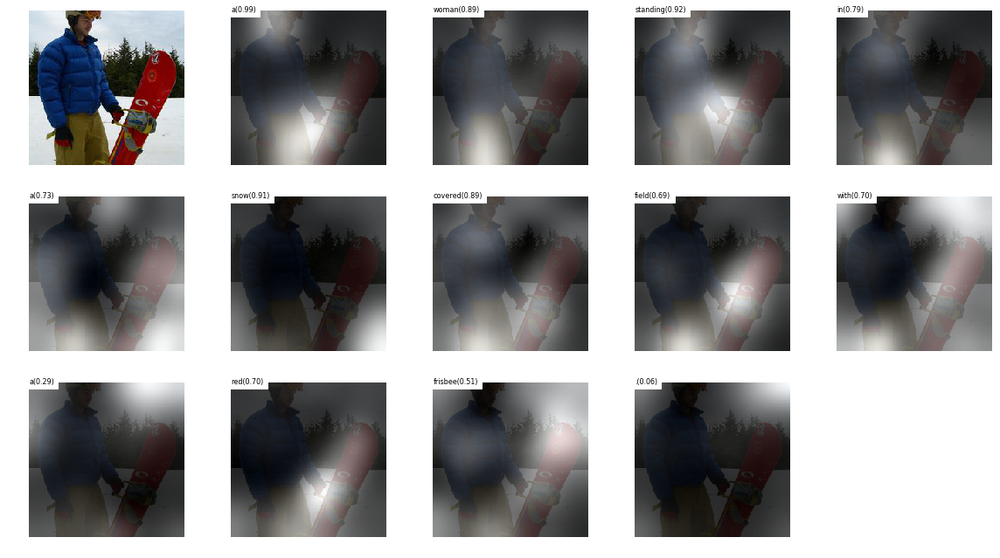

Sampled Caption: a plate of food that includes a salad and a sandwich .


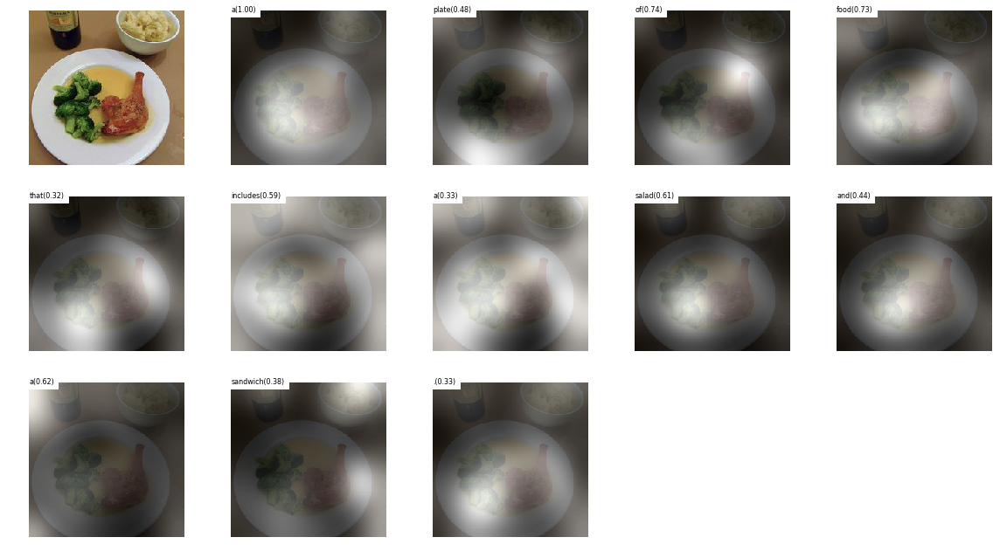

Sampled Caption: a group of people standing on a baseball field .


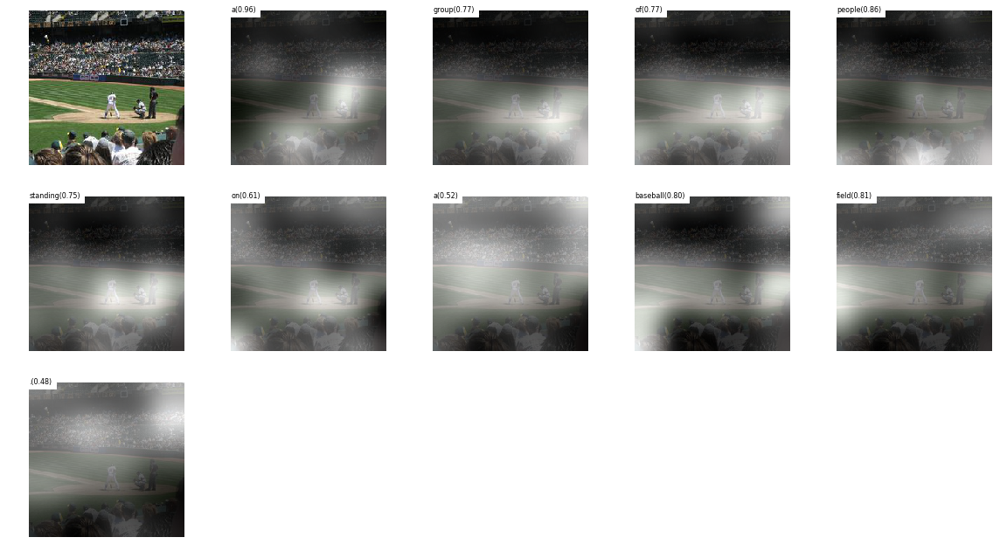

Sampled Caption: a black and white photo of a black car and a tree and a street .


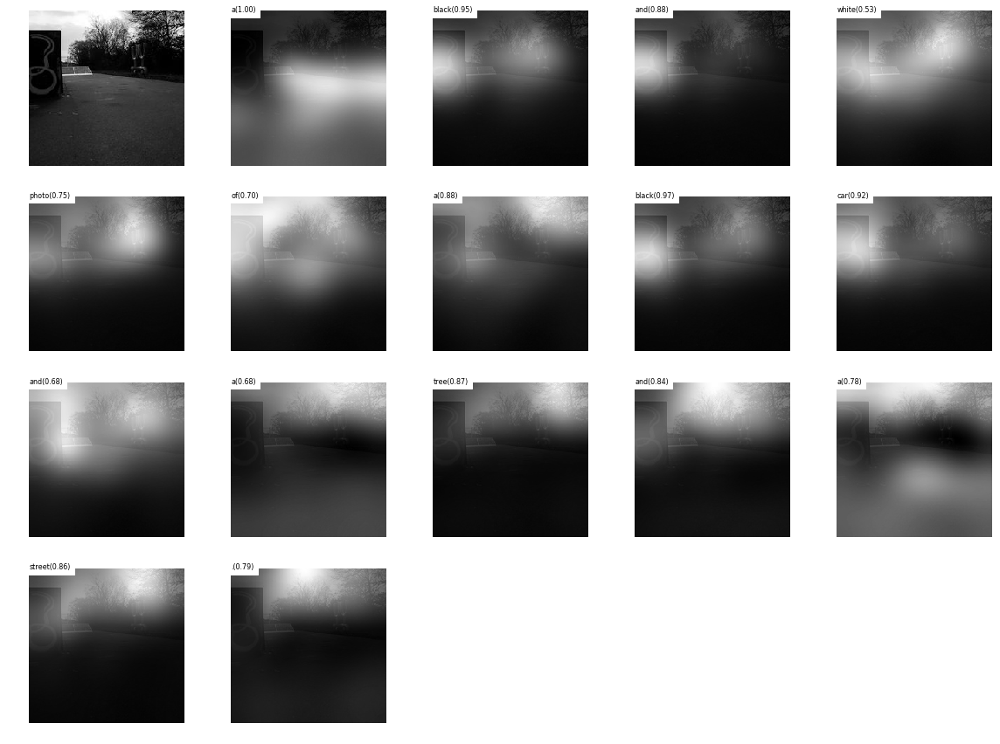

Sampled Caption: a small box of donuts is on a counter .


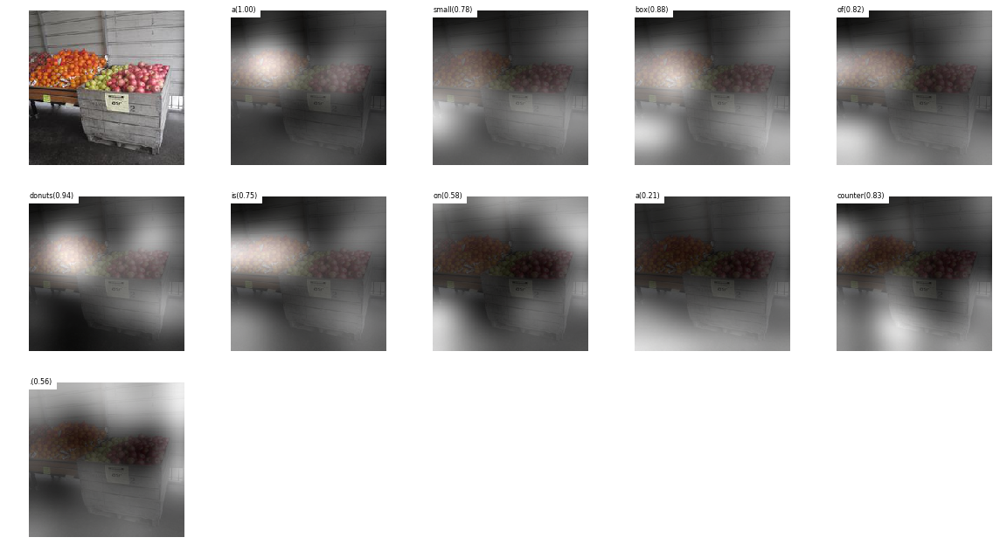

Sampled Caption: a man is jumping on a skateboard in a park .


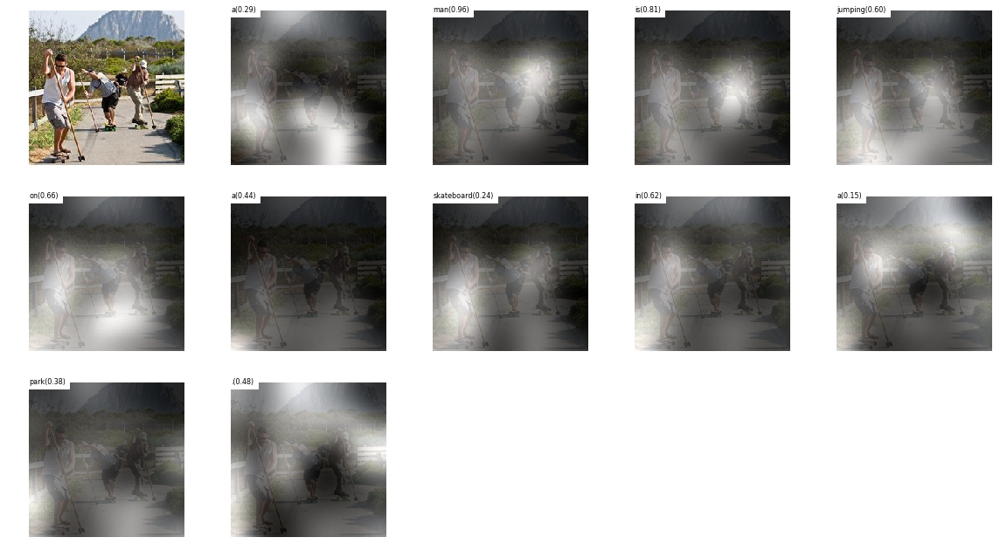

Sampled Caption: a young boy sitting on a blanket while eating a doughnut .


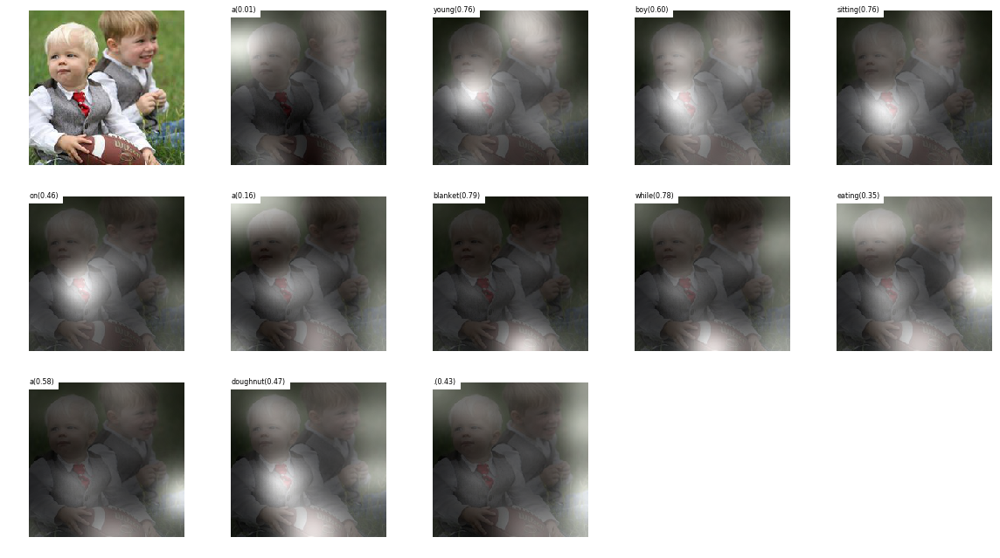

Sampled Caption: a large teddy bear laying down in a wooden chair .


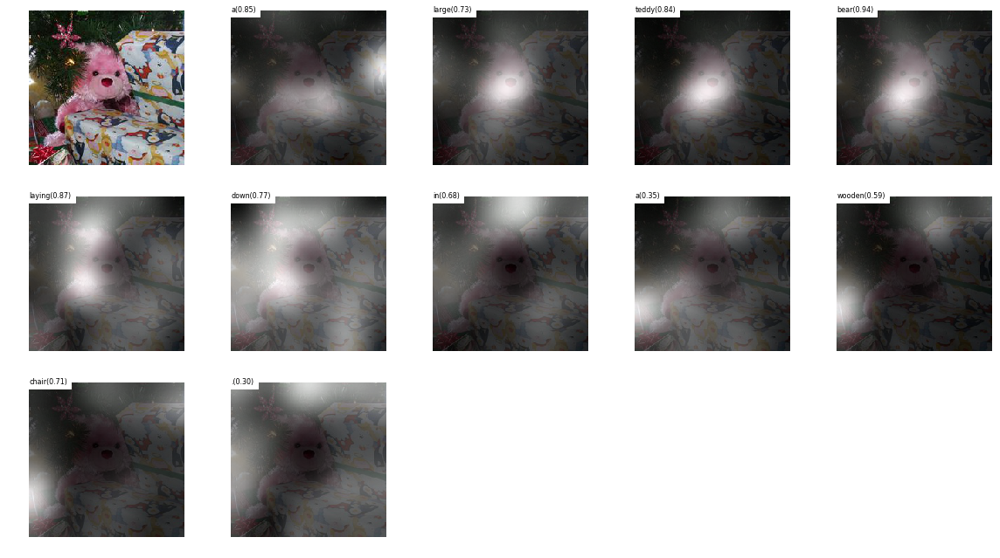

Sampled Caption: a baseball player is swinging at a pitch during a game .


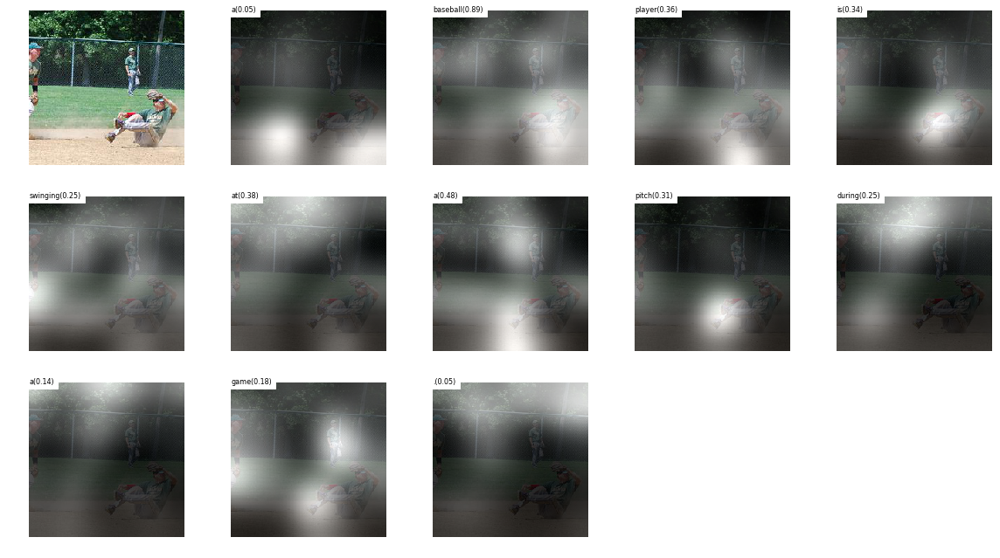

In [ ]:
tf.get_variable_scope().reuse_variables()
solver.test(test, split='test')

In [9]:
evaluate(data_path='./data', split='val')

{'reflen': 44157, 'guess': [45050, 40998, 36946, 32894], 'testlen': 45050, 'correct': [27852, 10639, 4127, 1718]}
ratio: 1.02022329415
Bleu_1:	0.618246392897
Bleu_2:	0.400543662383
Bleu_3:	0.261691082681
Bleu_4:	0.174911478506
METEOR:	0.199296929139
ROUGE_L: 0.4877318028130142
CIDEr:	0.5566400967668497


In [10]:
evaluate(data_path='./data', split='test')

{'reflen': 44138, 'guess': [44977, 40929, 36881, 32833], 'testlen': 44977, 'correct': [27625, 10431, 4022, 1648]}
ratio: 1.01900856405
Bleu_1:	0.614202814772
Bleu_2:	0.395642836651
Bleu_3:	0.257483061347
Bleu_4:	0.171089421642
METEOR:	0.19808283462
ROUGE_L: 0.48560746171677466
CIDEr:	0.5367360971104824
